<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Imports" data-toc-modified-id="Imports-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Imports</a></span></li><li><span><a href="#Download-data" data-toc-modified-id="Download-data-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Download data</a></span></li><li><span><a href="#Load-data" data-toc-modified-id="Load-data-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Load data</a></span><ul class="toc-item"><li><span><a href="#Taxi-trip-data" data-toc-modified-id="Taxi-trip-data-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Taxi trip data</a></span><ul class="toc-item"><li><span><a href="#Assess-data-quality" data-toc-modified-id="Assess-data-quality-3.1.1"><span class="toc-item-num">3.1.1&nbsp;&nbsp;</span>Assess data quality</a></span></li><li><span><a href="#Cleaning-function" data-toc-modified-id="Cleaning-function-3.1.2"><span class="toc-item-num">3.1.2&nbsp;&nbsp;</span>Cleaning function</a></span></li><li><span><a href="#Create-geodataframe" data-toc-modified-id="Create-geodataframe-3.1.3"><span class="toc-item-num">3.1.3&nbsp;&nbsp;</span>Create geodataframe</a></span></li><li><span><a href="#Drop-unnecessary-columns" data-toc-modified-id="Drop-unnecessary-columns-3.1.4"><span class="toc-item-num">3.1.4&nbsp;&nbsp;</span>Drop unnecessary columns</a></span></li></ul></li><li><span><a href="#ACS-demographic-&amp;-socio-economic-data" data-toc-modified-id="ACS-demographic-&amp;-socio-economic-data-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>ACS demographic &amp; socio-economic data</a></span><ul class="toc-item"><li><span><a href="#Unstack-columns" data-toc-modified-id="Unstack-columns-3.2.1"><span class="toc-item-num">3.2.1&nbsp;&nbsp;</span>Unstack columns</a></span></li><li><span><a href="#Cleaning" data-toc-modified-id="Cleaning-3.2.2"><span class="toc-item-num">3.2.2&nbsp;&nbsp;</span>Cleaning</a></span></li></ul></li><li><span><a href="#Census-block-group-geometries" data-toc-modified-id="Census-block-group-geometries-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Census block group geometries</a></span></li><li><span><a href="#Join-cencus-block-geometries-with-ACS-variables" data-toc-modified-id="Join-cencus-block-geometries-with-ACS-variables-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>Join cencus block geometries with ACS variables</a></span></li></ul></li><li><span><a href="#Visualisations" data-toc-modified-id="Visualisations-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Visualisations</a></span><ul class="toc-item"><li><span><a href="#Pickup-locations-plot" data-toc-modified-id="Pickup-locations-plot-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Pickup locations plot</a></span></li><li><span><a href="#ACS-covariate-example-plots-by-census-block" data-toc-modified-id="ACS-covariate-example-plots-by-census-block-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>ACS covariate example plots by census block</a></span></li></ul></li><li><span><a href="#Spatial-join-dataframes" data-toc-modified-id="Spatial-join-dataframes-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Spatial join dataframes</a></span></li><li><span><a href="#Partial-data-model" data-toc-modified-id="Partial-data-model-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Partial data model</a></span></li><li><span><a href="#Full-dataset-analysis" data-toc-modified-id="Full-dataset-analysis-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Full dataset analysis</a></span><ul class="toc-item"><li><span><a href="#Cleaning-and-remove-columns" data-toc-modified-id="Cleaning-and-remove-columns-7.1"><span class="toc-item-num">7.1&nbsp;&nbsp;</span>Cleaning and remove columns</a></span></li><li><span><a href="#CBG-pickup-counts" data-toc-modified-id="CBG-pickup-counts-7.2"><span class="toc-item-num">7.2&nbsp;&nbsp;</span>CBG pickup counts</a></span></li></ul></li><li><span><a href="#Baseline-Model" data-toc-modified-id="Baseline-Model-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Baseline Model</a></span></li></ul></div>

# Imports

In [1]:
from google.cloud import storage
import os
from tqdm import tqdm
from binascii import unhexlify, b2a_base64
import hashlib
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from cartoframes.auth import set_default_credentials
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from sklearn.impute import SimpleImputer
import numpy as np
from cartoframes.viz import Layer, color_bins_style
import seaborn as sns
import pickle
import dask.dataframe as dd
from dask.distributed import Client

In [2]:
client = Client()
client.restart()

Client Scheduler: tcp://127.0.0.1:50739 Dashboard: http://127.0.0.1:8787/status,Cluster Workers: 4 Cores: 4 Memory: 8.59 GB


# Download data

In [3]:
# Set data locations
SOURCE_FILES = ['nyc_cbg_geoms.geojson',
                'nyc_acs_demographics.csv', 'data.zip']
DATA_DIR = 'data'
# Google cloud bucket name
PROJECT_NAME = 'hiring-test'

In [4]:
def check_md5(blob, target):
    ''' Checks md5 hash of existing target file with source blob. 

    Args:
        blob (google cloud Blob): Source blob object
        target (str): Path of target file

    Returns:
        test (bool): True if md5 hashes of source and target files match
    '''
    # Reload source blob
    blob.reload()
    # Get source md5
    source_md5 = blob.md5_hash
    # Get target md5
    with open(target, "rb") as f:
        bytes = f.read()
        readable_hash = hashlib.md5(bytes).hexdigest()
        target_md5 = b2a_base64(unhexlify(readable_hash)
                                ).strip().decode("utf-8")
    test = (blob.md5_hash == target_md5)
    return test


def download_file(filename, data_dir=DATA_DIR, bucket_name=PROJECT_NAME):
    ''' Downloads a file from a google cloud storage bucket. 

    Args:
        filename (str): Name of file in storage bucket
        data_dir (str): Subdirectory in which to save data
        target (str): Path of target file

    Returns:
        None
    '''
    print('Downloading file: ' + filename)
    source = filename
    target = os.path.join(data_dir, filename)
    # Create google cloud client instance
    client = storage.Client.create_anonymous_client()
    # Create bucket instance for desired bucket
    bucket = client.bucket(bucket_name=PROJECT_NAME, user_project=None)
    # Blob source object
    blob = storage.Blob(source, bucket)
    # Check if file has already been downloaded
    if os.path.exists(target):
        print('File already exists')
        if check_md5(blob, target):
            print('md5 hash matches source')
        else:
            # Overwrite file
            blob.download_to_filename(filename=target, client=client)
    else:
        # Download blob to file
        blob.download_to_filename(filename=target, client=client)

In [5]:
[download_file(file) for file in SOURCE_FILES]

File already exists
md5 hash matches source
File already exists
md5 hash matches source
File already exists
md5 hash matches source


[None, None, None]

In [6]:
# Check if data.zip already unzipped, if not unzip
if not os.path.exists('data/yellow_tripdata_2015-07_00'):
    # Unzip data.zip
    !unzip data/data.zip
    print('data unzipped')
else:
    print('data already unzipped')

data already unzipped


# Load data

The yellow_tripdata files have no extension, but a google search suggested they are csv files. Here EDA is performed on only the first file.

## Taxi trip data

In [7]:
tripdata = pd.read_csv(os.path.join(DATA_DIR, 'yellow_tripdata_2015-07_00'))

In [8]:
tripdata.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RatecodeID,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,1,2015-07-01 00:00:00,2015-07-01 00:15:26,1,3.5,-73.994156,40.751125,1,N,-73.976822,40.788567,2,14.0,0.5,0.5,0.00,0.0,0.3,15.30
1,1,2015-07-01 00:00:00,2015-07-01 00:22:22,1,3.9,-73.984657,40.768486,1,N,-74.000130,40.734898,2,17.0,0.5,0.5,0.00,0.0,0.3,18.30
2,1,2015-07-01 00:00:00,2015-07-01 00:07:42,1,2.3,-73.978889,40.762287,1,N,-74.004219,40.752533,2,9.0,0.5,0.5,0.00,0.0,0.3,10.30
3,1,2015-07-01 00:00:00,2015-07-01 00:39:37,1,9.2,-73.992790,40.742760,1,N,-73.971512,40.637154,1,33.0,0.5,0.5,8.55,0.0,0.3,42.85
4,1,2015-07-01 00:00:00,2015-07-01 00:05:34,1,1.1,-73.912430,40.769810,1,N,-73.920334,40.757442,1,6.0,0.5,0.5,2.00,0.0,0.3,9.30


### Assess data quality

Check for null values:

In [10]:
tripdata.isna().sum()

VendorID                 0
tpep_pickup_datetime     0
tpep_dropoff_datetime    0
passenger_count          0
trip_distance            0
pickup_longitude         0
pickup_latitude          0
RatecodeID               0
store_and_fwd_flag       0
dropoff_longitude        0
dropoff_latitude         0
payment_type             0
fare_amount              0
extra                    0
mta_tax                  0
tip_amount               0
tolls_amount             0
improvement_surcharge    0
total_amount             0
dtype: int64

This section of the data contains no null values.

In [11]:
tripdata.describe()

,VendorID,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RatecodeID,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
count,499999.000000,499999.000000,4.999990e+05,499999.000000,499999.000000,499999.000000,499999.000000,499999.000000,499999.000000,499999.000000,499999.000000,499999.000000,499999.000000,499999.000000,499999.000000,499999.000000
mean,1.522219,1.648105,5.637624e+00,-72.951099,40.186604,1.040278,-73.002785,40.216333,1.366183,12.878082,0.325047,0.497444,1.720842,0.308052,0.299765,16.029452
std,0.499507,1.331315,1.889121e+03,8.641112,4.760352,0.503592,8.416901,4.636907,0.494912,10.766019,0.371955,0.037861,2.515012,1.846859,0.011374,13.278180
min,1.000000,0.000000,0.000000e+00,-81.115173,0.000000,1.000000,-101.147926,0.000000,1.000000,-140.000000,-1.000000,-0.500000,-3.520000,-5.540000,-0.300000,-140.800000
25%,1.000000,1.000000,1.010000e+00,-73.991844,40.736555,1.000000,-73.991081,40.735340,1.000000,6.500000,0.000000,0.500000,0.000000,0.000000,0.300000,8.760000
50%,2.000000,1.000000,1.720000e+00,-73.981613,40.752838,1.000000,-73.979263,40.753857,1.000000,9.500000,0.000000,0.500000,1.200000,0.000000,0.300000,12.050000
75%,2.000000,2.000000,3.200000e+00,-73.967163,40.766909,1.000000,-73.962799,40.767578,2.000000,14.500000,0.500000,0.500000,2.350000,0.000000,0.300000,17.800000
max,2.000000,8.000000,1.335809e+06,0.000000,50.202126,99.000000,0.000000,50.202126,4.000000,800.000000,1.500000,0.500000,390.000000,843.000000,0.300000,1190.300000


Due to the large quantity of data overall it should be possible to discard suspect data.
- Passenger counts of 0 are present - may represent a cancelled trip, which is not a true taxi pickup
- Likewise, trip distances of 0 do not make sense, unless the trip was cancelled.
- Pickup & dropoff latitudes and longitudes all have some 0 values. These should not make it through to the final dataset due to merging with known NYC block groups, but they can be removed to reduce dataset size.
- The data dictionary specifies RatecodeID range is (1-6), but we have RatecodeIDs up to 99.

In [12]:
print(len(tripdata[tripdata.trip_distance <= 0]))
print(len(tripdata[tripdata.passenger_count <= 0]))
print(len(tripdata[tripdata.pickup_latitude <= 0]))
print(len(tripdata[tripdata.pickup_longitude >= 0]))
print(len(tripdata[tripdata.dropoff_latitude <= 0]))
print(len(tripdata[tripdata.dropoff_longitude >= 0]))

3107
50
6918
6918
6559
6559


These numbers represent a fairly small ~1% proportion of the total dataset, so it should be safe to remove them.

/Users/tom/opt/miniconda3/envs/backup/lib/python3.6/site-packages/pandas/plotting/_matplotlib/converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


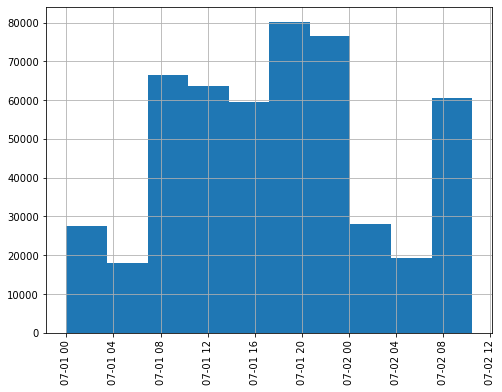

In [13]:
plt.figure(figsize=(8, 6))
pd.to_datetime(tripdata.tpep_pickup_datetime).hist(xrot=90)
plt.show()

Pickup times fall between 1st and 2nd of June as expected, with no outliers.

### Cleaning function

In [14]:
def clean_taxidata(taxidata_df):
    ''' Cleans taxi data, removing suspect values.
    Args:
        taxidata_df (pandas DataFrame): NYC taxi data

    Returns:
        cleaned_taxidata_df (pandas DataFrame)
    '''
    
    cleaned_taxidata_df = taxidata_df.copy()
    # Remove 0 latitude
    cleaned_taxidata_df = cleaned_taxidata_df[~(cleaned_taxidata_df.pickup_latitude == 0)]
    cleaned_taxidata_df = cleaned_taxidata_df[~(cleaned_taxidata_df.dropoff_latitude == 0)]

    # Remove 0 longitude
    cleaned_taxidata_df = cleaned_taxidata_df[~(cleaned_taxidata_df.pickup_longitude == 0)]
    cleaned_taxidata_df = cleaned_taxidata_df[~(cleaned_taxidata_df.dropoff_longitude == 0)]
    
    # Remove total_amount <= 0
    cleaned_taxidata_df = cleaned_taxidata_df[~(cleaned_taxidata_df.total_amount <= 0)]

    # Remove RatecodeID > 6 (edited because dask dataframe has different column capitalisation)
    try: 
        cleaned_taxidata_df = cleaned_taxidata_df[~(cleaned_taxidata_df.RatecodeID > 6)]
    except:
        cleaned_taxidata_df = cleaned_taxidata_df[~(cleaned_taxidata_df.RateCodeID > 6)]

    # Remove trip_distance <= 0
    cleaned_taxidata_df = cleaned_taxidata_df[~(cleaned_taxidata_df.trip_distance <= 0)]

    # Remove passenger_count <= 0
    cleaned_taxidata_df = cleaned_taxidata_df[~(cleaned_taxidata_df.passenger_count <= 0)]
    
    return cleaned_taxidata_df

In [15]:
tripdata = clean_taxidata(tripdata)
tripdata

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RatecodeID,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,1,2015-07-01 00:00:00,2015-07-01 00:15:26,1,3.50,-73.994156,40.751125,1,N,-73.976822,40.788567,2,14.0,0.5,0.5,0.00,0.0,0.3,15.30
1,1,2015-07-01 00:00:00,2015-07-01 00:22:22,1,3.90,-73.984657,40.768486,1,N,-74.000130,40.734898,2,17.0,0.5,0.5,0.00,0.0,0.3,18.30
2,1,2015-07-01 00:00:00,2015-07-01 00:07:42,1,2.30,-73.978889,40.762287,1,N,-74.004219,40.752533,2,9.0,0.5,0.5,0.00,0.0,0.3,10.30
3,1,2015-07-01 00:00:00,2015-07-01 00:39:37,1,9.20,-73.992790,40.742760,1,N,-73.971512,40.637154,1,33.0,0.5,0.5,8.55,0.0,0.3,42.85
4,1,2015-07-01 00:00:00,2015-07-01 00:05:34,1,1.10,-73.912430,40.769810,1,N,-73.920334,40.757442,1,6.0,0.5,0.5,2.00,0.0,0.3,9.30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499994,2,2015-07-02 10:27:16,2015-07-02 10:33:50,1,0.79,-73.995888,40.738892,1,N,-74.000977,40.746399,2,6.0,0.0,0.5,0.00,0.0,0.3,6.80
499995,1,2015-07-02 10:27:17,2015-07-02 10:28:44,1,0.30,-74.007195,40.744972,1,N,-74.001373,40.742607,1,3.5,0.0,0.5,0.00,0.0,0.3,4.30
499996,1,2015-07-02 10:27:17,2015-07-02 10:48:20,1,0.90,-73.966057,40.758812,1,N,-73.973724,40.747589,2,13.0,0.0,0.5,0.00,0.0,0.3,13.80
499997,2,2015-07-02 10:27:17,2015-07-02 10:47:41,2,5.50,-73.968010,40.751091,1,N,-74.014503,40.703030,2,20.5,0.0,0.5,0.00,0.0,0.3,21.30


9852 (2%) rows removed by cleaning

### Create geodataframe

In [16]:
tripdata_gdf = gpd.GeoDataFrame(tripdata,
                                geometry=gpd.points_from_xy(
                                    tripdata['pickup_longitude'], tripdata['pickup_latitude']),
                                crs='epsg:4326')

### Drop unnecessary columns

Now the data has been cleaned, the only pertinent information is now the location of the pickup

In [17]:
tripdata_gdf = tripdata_gdf[['geometry']]

## ACS demographic & socio-economic data

In [18]:
nyc_acs_demographics = pd.read_csv(os.path.join(DATA_DIR, 'nyc_acs_demographics.csv'), index_col=0)
print(nyc_acs_demographics.shape)
nyc_acs_demographics.head()

(199630, 3)


,geoid,acs_demog_var,value
0,360050001001,total_pop,7080.0
1,360050001001,two_or_more_races_pop,41.0
2,360050001001,vacant_housing_units_for_rent,0.0
3,360050001001,unemployed_pop,0.0
4,360050001001,black_pop,3984.0


Columns are stacked which is not suitable for merging with the taxi data.

### Unstack columns

In [19]:
nyc_acs_unstacked = nyc_acs_demographics.pivot(index='geoid', columns='acs_demog_var', values='value')
nyc_acs_unstacked = nyc_acs_unstacked.reset_index()
nyc_acs_unstacked.geoid = nyc_acs_unstacked.geoid.astype(str)
print(nyc_acs_unstacked.shape)
nyc_acs_unstacked.head()

(6339, 34)


acs_demog_var,geoid,aggregate_travel_time_to_work,amerindian_pop,asian_pop,black_pop,commuters_16_over,commuters_by_public_transportation,employed_pop,families_with_young_children,family_households,...,other_race_pop,owner_occupied_housing_units_median_value,pop_16_over,renter_occupied_housing_units_paying_cash_median_gross_rent,total_pop,two_or_more_races_pop,unemployed_pop,vacant_housing_units,vacant_housing_units_for_rent,white_pop
0,360050001001,NaN,25.0,125.0,3984.0,0.0,0.0,0.0,0.0,0.0,...,38.0,NaN,7080.0,NaN,7080.0,41.0,0.0,0.0,0.0,538.0
1,360050002001,NaN,0.0,0.0,468.0,608.0,271.0,608.0,63.0,356.0,...,0.0,384200.0,1543.0,1793.0,1919.0,0.0,168.0,30.0,0.0,13.0
2,360050002002,NaN,0.0,0.0,238.0,579.0,161.0,588.0,96.0,363.0,...,86.0,415300.0,1423.0,1358.0,1703.0,0.0,118.0,71.0,15.0,52.0
3,360050002003,NaN,0.0,104.0,202.0,382.0,108.0,382.0,33.0,239.0,...,0.0,374700.0,718.0,1677.0,920.0,0.0,9.0,57.0,0.0,12.0
4,360050004001,NaN,0.0,24.0,24.0,213.0,69.0,259.0,0.0,136.0,...,0.0,363900.0,417.0,1375.0,468.0,0.0,0.0,15.0,15.0,0.0


### Cleaning

In [20]:
nyc_acs_unstacked.describe()

acs_demog_var,aggregate_travel_time_to_work,amerindian_pop,asian_pop,black_pop,commuters_16_over,commuters_by_public_transportation,employed_pop,families_with_young_children,family_households,female_pop,...,other_race_pop,owner_occupied_housing_units_median_value,pop_16_over,renter_occupied_housing_units_paying_cash_median_gross_rent,total_pop,two_or_more_races_pop,unemployed_pop,vacant_housing_units,vacant_housing_units_for_rent,white_pop
count,362.000000,6339.000000,6339.000000,6339.000000,6339.000000,6339.000000,6339.000000,6339.000000,6339.000000,6339.000000,...,6339.000000,4.556000e+03,6339.000000,5807.000000,6339.000000,6339.000000,6339.000000,6339.000000,6339.000000,6339.000000
mean,34616.422652,2.380186,185.575170,295.618394,602.898880,352.085029,644.844613,98.536362,300.488405,702.815271,...,11.458116,6.872881e+05,1091.115160,1523.152574,1343.245149,25.833728,47.946364,50.476100,12.062786,432.200663
std,20381.770030,13.583396,285.281508,436.053112,336.115082,248.154204,356.828817,87.249059,158.296530,358.603710,...,43.207546,3.830040e+05,539.026034,535.556652,658.446589,43.511631,47.769236,68.955807,24.462099,486.881898
min,6450.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,9.999000e+03,0.000000,229.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,21785.000000,0.000000,10.000000,7.000000,397.000000,191.000000,425.000000,39.000000,200.000000,472.000000,...,0.000000,4.430000e+05,747.000000,1232.000000,918.000000,0.000000,15.000000,11.000000,0.000000,46.000000
50%,30877.500000,0.000000,72.000000,79.000000,552.000000,310.000000,588.000000,79.000000,278.000000,648.000000,...,0.000000,5.981500e+05,1013.000000,1442.000000,1249.000000,9.000000,36.000000,34.000000,0.000000,281.000000
75%,40933.750000,0.000000,237.500000,451.000000,751.500000,463.000000,800.000000,136.000000,374.000000,863.000000,...,0.000000,8.288000e+05,1332.000000,1728.000000,1648.000000,35.000000,67.000000,65.000000,17.000000,674.000000
max,195980.000000,274.000000,3960.000000,4744.000000,6483.000000,4849.000000,6767.000000,1030.000000,2250.000000,5037.000000,...,721.000000,2.000001e+06,7881.000000,3501.000000,8830.000000,766.000000,575.000000,1513.000000,467.000000,6111.000000


## Census block group geometries

In [21]:
nyc_cbg_gdf = gpd.read_file(os.path.join(DATA_DIR, 'nyc_cbg_geoms.geojson'))
nyc_cbg_gdf.crs = 'epsg:4326'
print(nyc_cbg_gdf.shape)
nyc_cbg_gdf.head()

(6339, 2)


,geoid,geometry
0,360050001001,"POLYGON ((-73.89277 40.79284, -73.89261 40.792..."
1,360050002001,"POLYGON ((-73.86285 40.81267, -73.86191 40.812..."
2,360050002002,"POLYGON ((-73.86708 40.81444, -73.86332 40.812..."
3,360050002003,"POLYGON ((-73.85856 40.80665, -73.85848 40.806..."
4,360050004001,"POLYGON ((-73.85972 40.81527, -73.85956 40.815..."


This provides an easy link between geoids and geometries of CBGs.

## Join cencus block geometries with ACS variables

In [22]:
nyc_acs_df = nyc_acs_unstacked.merge(nyc_cbg_gdf, on='geoid')
nyc_acs_gdf = gpd.GeoDataFrame(nyc_acs_df)

In [23]:
nyc_acs_gdf.head()

,geoid,aggregate_travel_time_to_work,amerindian_pop,asian_pop,black_pop,commuters_16_over,commuters_by_public_transportation,employed_pop,families_with_young_children,family_households,...,owner_occupied_housing_units_median_value,pop_16_over,renter_occupied_housing_units_paying_cash_median_gross_rent,total_pop,two_or_more_races_pop,unemployed_pop,vacant_housing_units,vacant_housing_units_for_rent,white_pop,geometry
0,360050001001,NaN,25.0,125.0,3984.0,0.0,0.0,0.0,0.0,0.0,...,NaN,7080.0,NaN,7080.0,41.0,0.0,0.0,0.0,538.0,"POLYGON ((-73.89277 40.79284, -73.89261 40.792..."
1,360050002001,NaN,0.0,0.0,468.0,608.0,271.0,608.0,63.0,356.0,...,384200.0,1543.0,1793.0,1919.0,0.0,168.0,30.0,0.0,13.0,"POLYGON ((-73.86285 40.81267, -73.86191 40.812..."
2,360050002002,NaN,0.0,0.0,238.0,579.0,161.0,588.0,96.0,363.0,...,415300.0,1423.0,1358.0,1703.0,0.0,118.0,71.0,15.0,52.0,"POLYGON ((-73.86708 40.81444, -73.86332 40.812..."
3,360050002003,NaN,0.0,104.0,202.0,382.0,108.0,382.0,33.0,239.0,...,374700.0,718.0,1677.0,920.0,0.0,9.0,57.0,0.0,12.0,"POLYGON ((-73.85856 40.80665, -73.85848 40.806..."
4,360050004001,NaN,0.0,24.0,24.0,213.0,69.0,259.0,0.0,136.0,...,363900.0,417.0,1375.0,468.0,0.0,0.0,15.0,15.0,0.0,"POLYGON ((-73.85972 40.81527, -73.85956 40.815..."


# Visualisations

## Pickup locations plot

In [24]:
Layer(tripdata_gdf.sample(1000))

## ACS covariate example plots by census block

In [25]:
# List variables
nyc_acs_gdf.columns

Index(['geoid', 'aggregate_travel_time_to_work', 'amerindian_pop', 'asian_pop',
       'black_pop', 'commuters_16_over', 'commuters_by_public_transportation',
       'employed_pop', 'families_with_young_children', 'family_households',
       'female_pop', 'hispanic_pop', 'households', 'housing_units',
       'housing_units_renter_occupied', 'income_per_capita', 'male_pop',
       'married_households', 'median_age', 'median_income', 'median_rent',
       'median_year_structure_built', 'nonfamily_households',
       'occupied_housing_units', 'other_race_pop',
       'owner_occupied_housing_units_median_value', 'pop_16_over',
       'renter_occupied_housing_units_paying_cash_median_gross_rent',
       'total_pop', 'two_or_more_races_pop', 'unemployed_pop',
       'vacant_housing_units', 'vacant_housing_units_for_rent', 'white_pop',
       'geometry'],
      dtype='object')

In [26]:
Layer(nyc_acs_gdf, color_bins_style('median_income'))

In [27]:
Layer(nyc_acs_gdf, color_bins_style('median_age'), encode_data=False)

# Spatial join dataframes

This function checks which census block each pickup point is within, and records this in the geoid column. 

In [28]:
tripdata_gdf_cbgs = gpd.sjoin(tripdata_gdf, nyc_cbg_gdf, how='inner', op='within')
print(tripdata_gdf_cbgs.shape)
tripdata_gdf_cbgs.head()

(489783, 3)


,geometry,index_right,geoid
0,POINT (-73.99416 40.75113),3575,360610101001
30,POINT (-73.99356 40.75190),3575,360610101001
111,POINT (-73.99156 40.74939),3575,360610101001
120,POINT (-73.99145 40.74995),3575,360610101001
224,POINT (-73.99403 40.75123),3575,360610101001


We can then produce the dataframe containing counts of pickups by census block that is needed for the final analysis:

In [29]:
trip_counts_df = tripdata_gdf_cbgs.groupby('geoid').count()
trip_counts_df = trip_counts_df.reset_index()
trip_counts_df.geoid = trip_counts_df.geoid.astype(str)
trip_counts_df = trip_counts_df.merge(nyc_acs_gdf, on='geoid', how='left')
trip_counts_df.drop(['index_right', 'geometry_y'], axis=1, inplace=True)
trip_counts_df.head()

,geoid,geometry_x,aggregate_travel_time_to_work,amerindian_pop,asian_pop,black_pop,commuters_16_over,commuters_by_public_transportation,employed_pop,families_with_young_children,...,other_race_pop,owner_occupied_housing_units_median_value,pop_16_over,renter_occupied_housing_units_paying_cash_median_gross_rent,total_pop,two_or_more_races_pop,unemployed_pop,vacant_housing_units,vacant_housing_units_for_rent,white_pop
0,360050004002,2,NaN,0.0,0.0,54.0,396.0,138.0,396.0,0.0,...,0.0,350000.0,884.0,1417.0,1090.0,0.0,36.0,81.0,51.0,56.0
1,360050019001,31,35695.0,0.0,57.0,541.0,843.0,573.0,852.0,220.0,...,12.0,NaN,1255.0,1260.0,1702.0,35.0,90.0,43.0,21.0,163.0
2,360050019002,3,NaN,0.0,8.0,19.0,73.0,53.0,73.0,0.0,...,0.0,NaN,150.0,950.0,161.0,0.0,13.0,9.0,0.0,11.0
3,360050019003,2,NaN,0.0,17.0,374.0,334.0,264.0,334.0,19.0,...,7.0,393300.0,661.0,1451.0,902.0,20.0,89.0,21.0,0.0,88.0
4,360050023001,4,NaN,25.0,0.0,1040.0,656.0,502.0,696.0,180.0,...,0.0,NaN,1897.0,508.0,2378.0,0.0,96.0,0.0,0.0,0.0


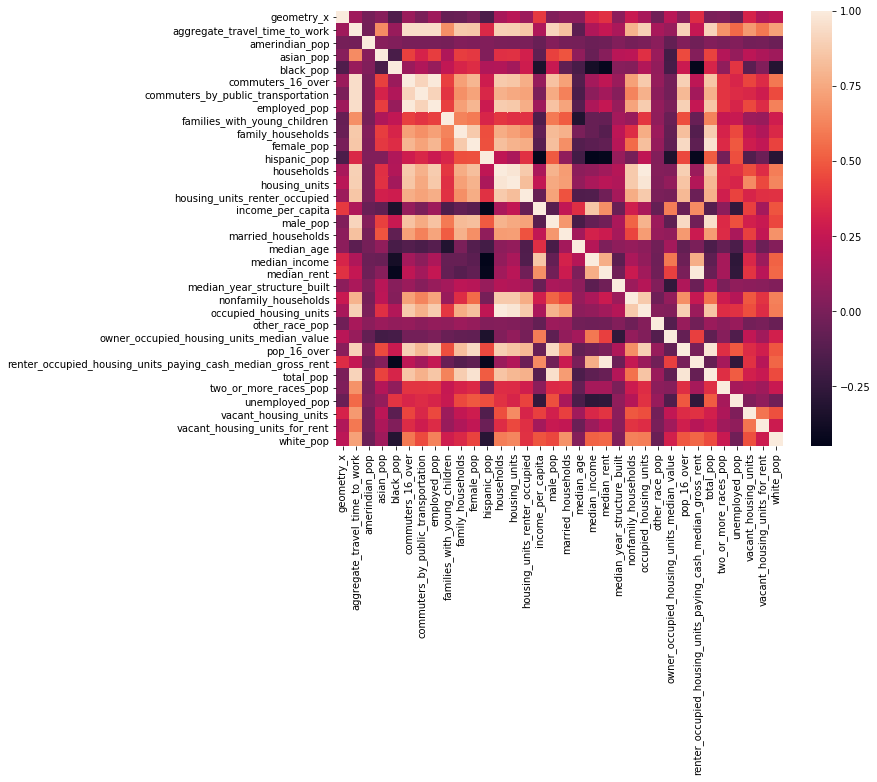

In [30]:
corr = trip_counts_df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr)
plt.show()

The heatmap shows only weak levels of correlation between the target count variable (currently called geometry_x) and a few variables such as median income and median rent. There is quite strong correlation between other similar variables such as households and housing units, which could cause problems if fitting a linear regression model.

In [31]:
y = trip_counts_df.geometry_x
X = trip_counts_df.drop(['geometry_x', 'geoid'], axis=1)

In [32]:
X.isna().sum()

aggregate_travel_time_to_work                                  2342
amerindian_pop                                                    0
asian_pop                                                         0
black_pop                                                         0
commuters_16_over                                                 0
commuters_by_public_transportation                                0
employed_pop                                                      0
families_with_young_children                                      0
family_households                                                 0
female_pop                                                        0
hispanic_pop                                                      0
households                                                        0
housing_units                                                     0
housing_units_renter_occupied                                     0
income_per_capita                               

In the ACS data we do have missing variables, so a simple mean imputation is used to fill these:

In [33]:
imp_mean = SimpleImputer(missing_values=np.nan, strategy='mean')

In [34]:
X_imputed = pd.DataFrame(imp_mean.fit_transform(X))
X_imputed.columns = X.columns
X_imputed.index = X.index

# Partial data model

In [35]:
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.2)

/Users/tom/opt/miniconda3/envs/backup/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[11:49:09] WARNING: /usr/local/miniconda/conda-bld/xgboost_1572315027083/work/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
XGBoost train score: 0.79
XGBoost test score: 0.34


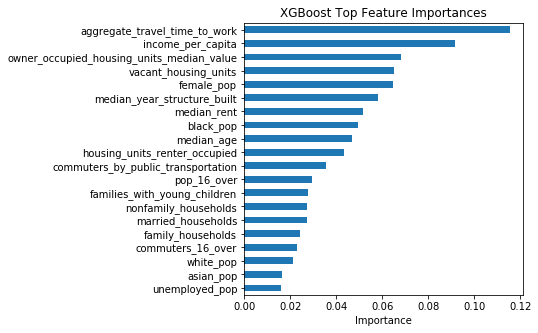

In [36]:
xgb = XGBRegressor()
xgb.fit(X_train, y_train)
print('XGBoost train score: {:.2f}'.format(xgb.score(X_train, y_train)))
print('XGBoost test score: {:.2f}'.format(xgb.score(X_test, y_test)))
features = X_imputed.columns
importances = pd.DataFrame(xgb.feature_importances_, index=features, columns=['Importance'])
ax = importances.sort_values(by='Importance').tail(
    20).plot(kind='barh', figsize=(5, 5), legend=None)
ax.set_title('XGBoost Top Feature Importances')
ax.set_xlabel('Importance')
plt.show()

The model performs much worse on test than training data which suggests it is strongly overfitting. XGBoost was chosen as a baseline because:

- it is insensitive to multicollinearity issues
- it tends to produce a good result with minimal hyperparameter tuning
- it deals well with a high number of features (performs inherent feature selection)

# Full dataset analysis

Using dask, the entire dataset can be read into a single dask DataFrame, made up of many pandas DataFrames. This makes it possible to deal with data that is too large to fit into memory as a single DataFrame object.

In [37]:
dask_df = dd.read_csv(os.path.join(DATA_DIR, 'yellow_tripdata_2015-*'))

## Cleaning and remove columns

The cleaning function from the partial dataset analysis can be reused.

In [38]:
dask_df = clean_taxidata(dask_df)

# Reduce to only the necessary columns
dask_df = dask_df[['pickup_longitude', 'pickup_latitude']]

## CBG pickup counts

In [39]:
def assign_cbg_zone(df, long_var, lat_var, cbg_df):
    ''' Assigns cbg zone to each row in partition of dask dataframe
    Args:
        df (pandas DataFrame): Partition of dask dataframe containing pickup locations
        long_var (str): name of longitudinal variable column
        lat_var (str): name of latitudinal variable column
        cbg_df (pandas DataFrame): DataFrame containing census block geometries

    Returns:
        temp_gdf.geoid (pandas Series): geoid numbers for census block of each each pickup location 
    '''
    temp_df = df[[long_var, lat_var]].copy()
    temp_gdf = gpd.GeoDataFrame(temp_df,
                                geometry=gpd.points_from_xy(
                                    temp_df[long_var], temp_df[lat_var]))
    temp_gdf.crs = "epsg:4326"

    temp_gdf = gpd.sjoin(temp_gdf, cbg_df, how='left', op='within')

    return temp_gdf.geoid

In [40]:
# Apply census block location function to each partition of dask DataFrame
dask_df['cbg_geoid'] = dask_df.map_partitions(
    assign_cbg_zone, 'pickup_longitude', 'pickup_latitude', cbg_df=nyc_cbg_gdf)

In [41]:
# Group pickups by census block and count them. Compute method resolves the dask DataFrame into a pandas DataFrame
%time cbg_counts = dask_df.groupby('cbg_geoid').count().compute()
cbg_counts = cbg_counts.reset_index()
cbg_counts = cbg_counts.rename(columns={'pickup_longitude': 'pickup_count'})
cbg_counts = cbg_counts[['cbg_geoid', 'pickup_count']]
# Save result of this analysis to avoid having to compute every time.
pickle.dump(cbg_counts, open(os.path.join(DATA_DIR, 'cbg_counts.p'), 'wb'))

CPU times: user 1min 7s, sys: 7.49 s, total: 1min 14s
Wall time: 7min 56s


In [42]:
# Load cbg_counts from pickle file
cbg_counts = pickle.load(open(os.path.join(DATA_DIR, 'cbg_counts.p'), 'rb'))
print(cbg_counts.shape)

(5913, 2)


In [43]:
# Merge pickup counts with the ACS demographic variables using geoid of census block
cbg_acs_df = cbg_counts.merge(nyc_acs_gdf, left_on='cbg_geoid', right_on='geoid', how='left', validate='one_to_one')
print(cbg_acs_df.shape)
cbg_acs_df.head()

(5913, 37)


,cbg_geoid,pickup_count,geoid,aggregate_travel_time_to_work,amerindian_pop,asian_pop,black_pop,commuters_16_over,commuters_by_public_transportation,employed_pop,...,owner_occupied_housing_units_median_value,pop_16_over,renter_occupied_housing_units_paying_cash_median_gross_rent,total_pop,two_or_more_races_pop,unemployed_pop,vacant_housing_units,vacant_housing_units_for_rent,white_pop,geometry
0,360050001001,46,360050001001,NaN,25.0,125.0,3984.0,0.0,0.0,0.0,...,NaN,7080.0,NaN,7080.0,41.0,0.0,0.0,0.0,538.0,"POLYGON ((-73.89277 40.79284, -73.89261 40.792..."
1,360050004002,12,360050004002,NaN,0.0,0.0,54.0,396.0,138.0,396.0,...,350000.0,884.0,1417.0,1090.0,0.0,36.0,81.0,51.0,56.0,"MULTIPOLYGON (((-73.85568 40.81551, -73.85568 ..."
2,360050016004,18,360050016004,NaN,0.0,0.0,187.0,323.0,106.0,323.0,...,515600.0,917.0,1523.0,1094.0,0.0,22.0,21.0,0.0,71.0,"POLYGON ((-73.86208 40.81752, -73.86198 40.817..."
3,360050019001,1939,360050019001,35695.0,0.0,57.0,541.0,843.0,573.0,852.0,...,NaN,1255.0,1260.0,1702.0,35.0,90.0,43.0,21.0,163.0,"POLYGON ((-73.93094 40.80825, -73.92955 40.807..."
4,360050019002,66,360050019002,NaN,0.0,8.0,19.0,73.0,53.0,73.0,...,NaN,150.0,950.0,161.0,0.0,13.0,9.0,0.0,11.0,"POLYGON ((-73.92028 40.80291, -73.91733 40.801..."


In [44]:
Layer(cbg_acs_df, color_bins_style('pickup_count'), encode_data=False, geom_col='geometry')

# Baseline Model

In [45]:
X_dask = cbg_acs_df.drop(['cbg_geoid', 'geoid', 'geometry', 'pickup_count'], axis=1)
y_dask = cbg_acs_df.pickup_count
X_dask_imputed = pd.DataFrame(imp_mean.fit_transform(X_dask))
X_dask_imputed.columns = X_dask.columns
X_dask_imputed.index = X_dask.index
X_dask_imputed = StandardScaler().fit_transform(X_dask_imputed)

In [57]:
X_train, X_test, y_train, y_test = train_test_split(X_dask_imputed, y_dask)

/Users/tom/opt/miniconda3/envs/backup/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[12:08:02] WARNING: /usr/local/miniconda/conda-bld/xgboost_1572315027083/work/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
XGBoost train score: 0.62
XGBoost test score: 0.35


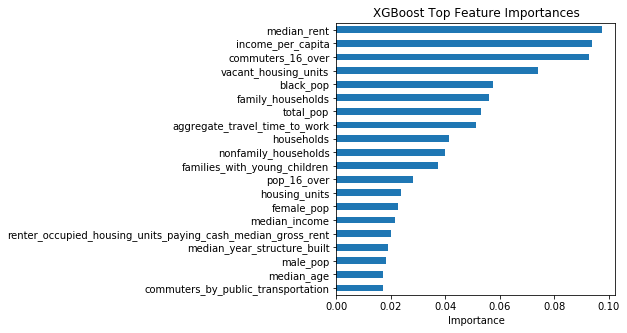

In [58]:
xgb = XGBRegressor()
xgb.fit(X_train, y_train)
print('XGBoost train score: {:.2f}'.format(xgb.score(X_train, y_train)))
print('XGBoost test score: {:.2f}'.format(xgb.score(X_test, y_test)))
features = X_dask.columns
importances = pd.DataFrame(xgb.feature_importances_, index=features, columns=['Importance'])
ax = importances.sort_values(by='Importance').tail(
    20).plot(kind='barh', figsize=(5, 5), legend=None)
ax.set_title('XGBoost Top Feature Importances')
ax.set_xlabel('Importance')
plt.show()

The model performs quite similarly to the model fitted to the partial data, suggesting lack of samples is not the issue. 
Possible Improvements:
- Perform feature engineering to create better predictive features from existing ones (population density..)
- Add better predictive features (proximity to city centre..)
- Perform more extensive cleaning on ACS variables - e.g. median_year_structure_built contains a lot of 0 values which are suspicious.